# 2: Calcolo dell'evapotraspirazione con il modello di Penman - Monteith

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import plotly.express as px
import os
import plotly.graph_objects as go

## - Simfile modificato

import static oms3.SimBuilder.instance as OMS3
import static oms3.SimBuilder.*
def home = oms_prj

def startDate	= "2020-01-01 00:00"
def endDate		= "2022-01-01 00:00"
def basin 		= "Cavone"
def ID			= 1
def timestep 	= 60

OMS3.sim {
     resource "$oms_prj/lib"
     model(while:"readerAirTemperature.doProcess")	{
        components {
				
			//Input-Output components
			"input"     "it.geoframe.blogspot.geoet.inout.InputReaderMain"
			"output"    "it.geoframe.blogspot.geoet.inout.OutputWriterMain"
			
			//GEOET components
			"penmanMonteithFao"             "it.geoframe.blogspot.geoet.penmanmonteithfao.PenmanMonteithFAOTotalStressedSolverMain"
			"PMstressfactor"				"it.geoframe.blogspot.geoet.stressfactor.solver.PTPMStressFactorSolverMain"
				
			"readerAirTemperature"              "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerWindVelocity"             	"org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerRelativeHumidity"            "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerNetRadiation"                "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerAtmosphericPressure"         "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"
			"readerSoilHeatFlux"                "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"	
			"readerSoilMoisture"                "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorReader"	
			"readerCentroids"				    "org.hortonmachine.gears.io.shapefile.OmsShapefileFeatureReader"		       
			"readerDem"							"org.hortonmachine.gears.io.rasterreader.OmsRasterReader" 
			"writerLatentHeatFAO"               "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"						
			"writerETFAO"                       "org.hortonmachine.gears.io.timedependent.OmsTimeSeriesIteratorWriter"	
	 
			}
			parameter{		

				// GEOgraphy PARAMETERS
				"readerDem.file"			"${home}/data/${basin}/${ID}/dem_${ID}.tif"	 
				"readerCentroids.file"		"${home}/data/${basin}/${ID}/centroids_ID_${ID}.shp"
				"input.idCentroids"			"ID"
				"input.centroidElevation"	"Elevation"

				// PARAMETERS
				"penmanMonteithFao.canopyHeight"				4 					
		        "penmanMonteithFao.soilFluxParameterDay"		0.35
		        "penmanMonteithFao.soilFluxParameterNight"	0.75
		        "output.doPrintOutputPM"						true
				"input.tStartDate"							"${startDate}"
				"input.temporalStep"							"${timestep}"
				
				//Parameters for the Radiation Stress
				"PMstressfactor.useRadiationStress" true
				  
				"PMstressfactor.alpha" 		0.005
				"PMstressfactor.theta" 		0.85
				
				//Parameter for the Vapour Pressure Deficit Stress
				"PMstressfactor.useVDPStress" true
				
				"PMstressfactor.VPD0" 	5.0 
				
				//Parameters for the Temperature Stress
				"PMstressfactor.useTemperatureStress" true 
				   	
				"PMstressfactor.Tl" 		"-5.0"
				"PMstressfactor.T0" 		20.0
				"PMstressfactor.Th" 		45.0 
				
				//Parameters for the Water Stress 
				"PMstressfactor.useWaterStress" true 
				     	
				"PMstressfactor.waterWiltingPoint"	0.06   //FAO Table 19 - http://www.fao.org/3/X0490E/x0490e0c.htm#TopOfPage
				"PMstressfactor.waterFieldCapacity"	0.18
				"PMstressfactor.depth"  				1.0
				"PMstressfactor.depletionFraction" 	0.4   //FAO Table 22 - http://www.fao.org/3/X0490E/x0490e0e.htm#TopOfPage
				"PMstressfactor.cropCoefficient" 	0.45
								
				//	READERS				
				"readerAirTemperature.file"         			"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/temp.csv"
				"readerAirTemperature.idfield"          		"ID"		
				"readerAirTemperature.tStart"           		"${startDate}"
				"readerAirTemperature.tEnd"         			"${endDate}"
				"readerAirTemperature.tTimestep"            	"${timestep}"
				"readerAirTemperature.fileNovalue"          	"-9999.0"
								
				"readerWindVelocity.file"                       "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/vento.csv"
				"readerWindVelocity.idfield"                    "ID"		
				"readerWindVelocity.tStart"                     "${startDate}"
				"readerWindVelocity.tEnd"                       "${endDate}"
				"readerWindVelocity.tTimestep"                  "${timestep}"
				"readerWindVelocity.fileNovalue"                "-9999.0"
								
				"readerRelativeHumidity.file"                   "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/umidità.csv"
				"readerRelativeHumidity.idfield"                "ID"		
				"readerRelativeHumidity.tStart"                 "${startDate}"
				"readerRelativeHumidity.tEnd"                   "${endDate}"
				"readerRelativeHumidity.tTimestep"              "${timestep}"
				"readerRelativeHumidity.fileNovalue"            "-9999.0"
								
				"readerNetRadiation.file"                       "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/Net_allsky_1.csv"
				"readerNetRadiation.idfield"                    "ID"
				"readerNetRadiation.tStart"                     "${startDate}"
				"readerNetRadiation.tEnd"                       "${endDate}"
				"readerNetRadiation.tTimestep"                  "${timestep}"
				"readerNetRadiation.fileNovalue"                "-9999.0"
						
				"readerAtmosphericPressure.file"                "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/p_atm.csv
				"readerAtmosphericPressure.idfield"             "ID"		
				"readerAtmosphericPressure.tStart"              "${startDate}"
				"readerAtmosphericPressure.tEnd"                "${endDate}"
				"readerAtmosphericPressure.tTimestep"           "${timestep}"
				"readerAtmosphericPressure.fileNovalue"         "-9999.0"
								
				"readerSoilHeatFlux.file"                       "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/GHF_9999.csv"
                "readerSoilHeatFlux.idfield"                    "ID"		
                "readerSoilHeatFlux.tStart"                     "${startDate}"
                "readerSoilHeatFlux.tEnd"                       "${endDate}"
                "readerSoilHeatFlux.tTimestep"                  "${timestep}"
                "readerSoilHeatFlux.fileNovalue"                "-9999.0"			
		
				"readerSoilMoisture.file"                        "C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/SoilMoisture.csv"
                "readerSoilMoisture.idfield"                     "ID"		
                "readerSoilMoisture.tStart"                      "${startDate}"
                "readerSoilMoisture.tEnd"                        "${endDate}"
                "readerSoilMoisture.tTimestep"                   "${timestep}"
                "readerSoilMoisture.fileNovalue"                 "-9999.0"																				
		
                //	WRITERS				              
				"writerLatentHeatFAO.file"						"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/LatentHeat_PMFAO_2.csv"	
				"writerLatentHeatFAO.tStart"					"${startDate}"
				"writerLatentHeatFAO.tTimestep"					"${timestep}"
				
				"writerETFAO.file"								"C:/Users/E580/Desktop/UNI/Idrologia/Esercitazione2/EvapoTranspiration_PMFAO_2.csv" 
				"writerETFAO.tStart"							"${startDate}"
				"writerETFAO.tTimestep"							"${timestep}"
				
            }
            connect	{
                "input.doProcess"                   	"penmanMonteithFao.doProcess" 
				"penmanMonteithFao.doProcessOut"        "output.doProcessOut"
                
                "readerAirTemperature.outData"			"input.inAirTemperature"
				"readerWindVelocity.outData"			"input.inWindVelocity"
				"readerRelativeHumidity.outData"		"input.inRelativeHumidity"
				"readerNetRadiation.outData"			"input.inNetRadiation"
				"readerAtmosphericPressure.outData"		"input.inAtmosphericPressure"
				"readerSoilHeatFlux.outData"			"input.inSoilFlux"
				"readerSoilMoisture.outData"			"input.inSoilMoisture"
				
				"PMstressfactor.stressSun"				"penmanMonteithFao.stressFactor"
				
				"readerCentroids.geodata"				"input.inCentroids"
				"readerDem.outRaster"					"input.inDem"
				 									
				"output.outLatentHeatPM"			"writerLatentHeatFAO.inData"
				"output.outEvapoTranspirationPM"    "writerETFAO.inData"
			}
			}
		}


# Evapotraspirazione potenziale

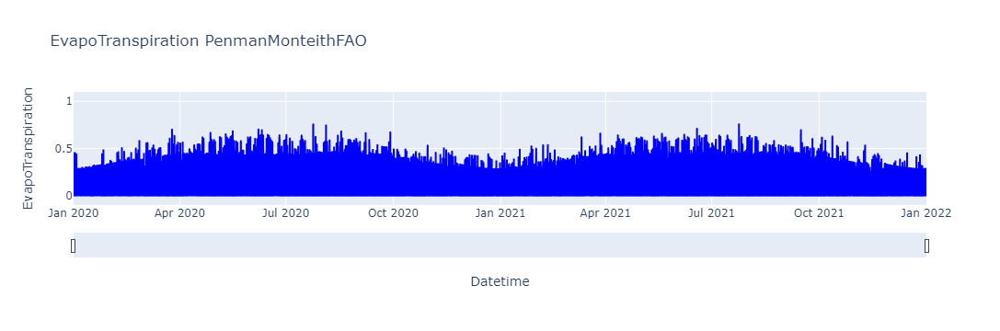

In [2]:
pot = pd.read_csv('PotentialEvapotranspiration_PMFAO_2.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
pot.columns = ['Datetime','EvapoTranspiration']
fig = px.line(pot, x='Datetime', y='EvapoTranspiration', title='EvapoTranspiration PenmanMonteithFAO')
fig.update_layout(yaxis_range=[-0.1, 1.1])
fig.update_traces(line_color='blue')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

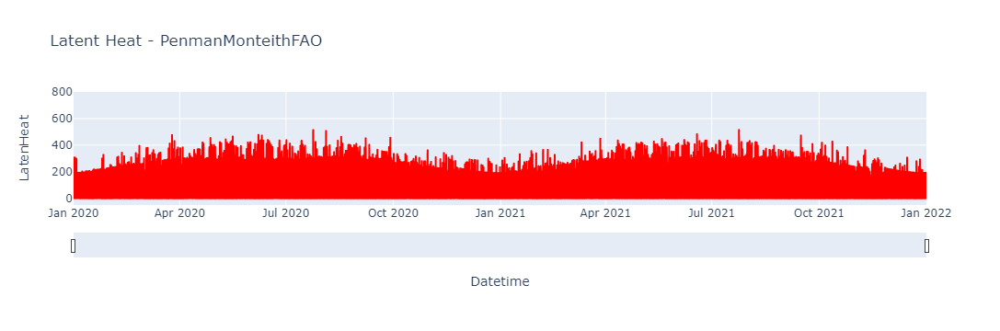

In [3]:
pot_lh = pd.read_csv('PotentialLatentHeat_PMFAO_2.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
pot_lh.columns = ['Datetime','LatenHeat']
fig = px.line(pot_lh, x='Datetime', y='LatenHeat', title='Latent Heat - PenmanMonteithFAO')
fig.update_layout(yaxis_range=[-50, 800])
fig.update_traces(line_color='red')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

# Evapotraspirazione effettiva

## Radiation Stress

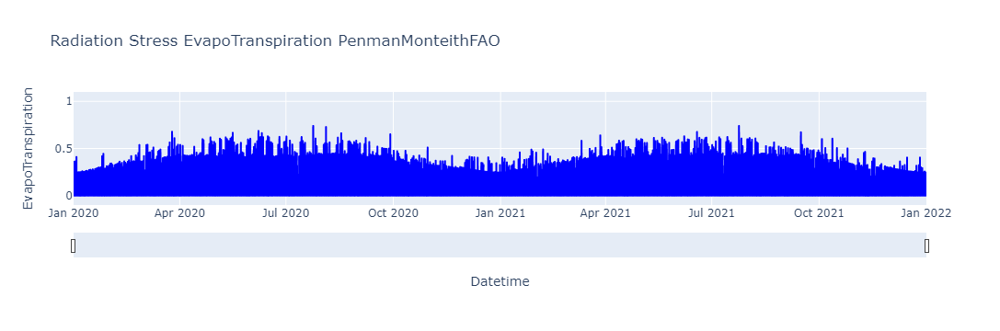

In [4]:
rad = pd.read_csv('RadiationEvapotranspiration_PMFAO_2.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
rad.columns = ['Datetime','EvapoTranspiration']
fig = px.line(rad, x='Datetime', y='EvapoTranspiration', title='Radiation Stress EvapoTranspiration PenmanMonteithFAO')
fig.update_layout(yaxis_range=[-0.1, 1.1])
fig.update_traces(line_color='blue')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

## Vapour Pressure Deficit Stress

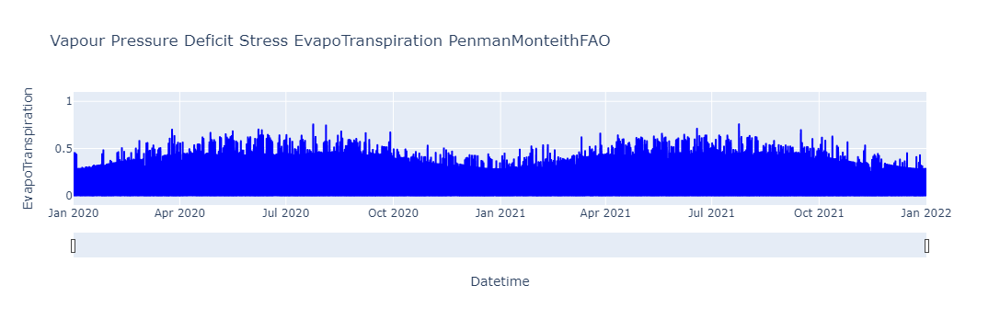

In [5]:
vap = pd.read_csv('VapourPressureEvapotranspiration_PMFAO_2.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
vap.columns = ['Datetime','EvapoTranspiration']
fig = px.line(vap, x='Datetime', y='EvapoTranspiration', title='Vapour Pressure Deficit Stress EvapoTranspiration PenmanMonteithFAO')
fig.update_layout(yaxis_range=[-0.1, 1.1])
fig.update_traces(line_color='blue')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

## Temperature Stress

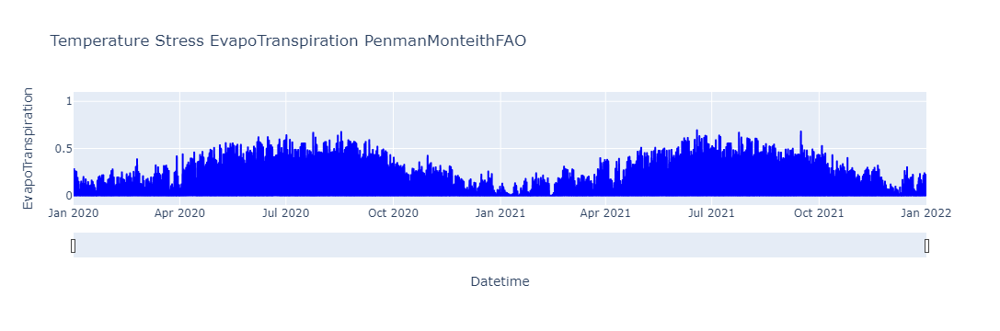

In [6]:
temp = pd.read_csv('TemperatureEvapotranspiration_PMFAO_2.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
temp.columns = ['Datetime','EvapoTranspiration']
fig = px.line(temp, x='Datetime', y='EvapoTranspiration', title='Temperature Stress EvapoTranspiration PenmanMonteithFAO')
fig.update_layout(yaxis_range=[-0.1, 1.1])
fig.update_traces(line_color='blue')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

## Water Stress

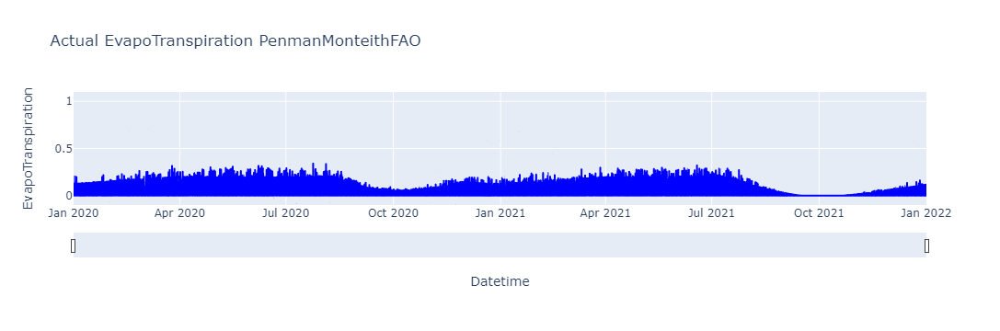

In [7]:
wat = pd.read_csv('WaterEvapotranspiration_PMFAO_2.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
wat.columns = ['Datetime','EvapoTranspiration']
fig = px.line(wat, x='Datetime', y='EvapoTranspiration', title='Actual EvapoTranspiration PenmanMonteithFAO')
fig.update_layout(yaxis_range=[-0.1, 1.1])
fig.update_traces(line_color='blue')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

## Actual Evapotranspiration

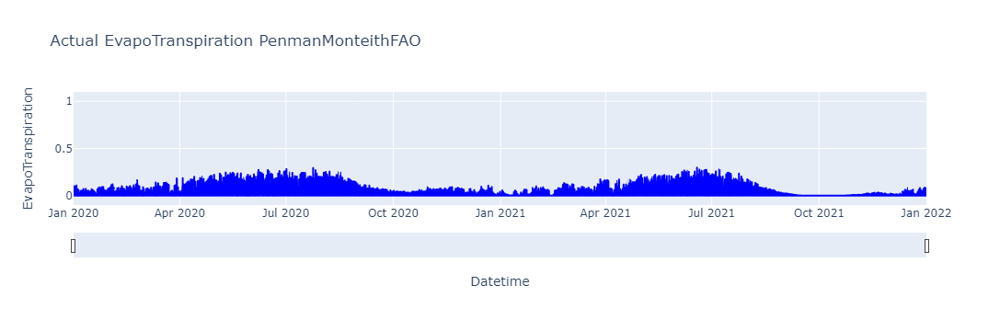

In [8]:
act = pd.read_csv('ActualEvapotranspiration_PMFAO_2.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
act.columns = ['Datetime','EvapoTranspiration']
fig = px.line(act, x='Datetime', y='EvapoTranspiration', title='Actual EvapoTranspiration PenmanMonteithFAO')
fig.update_layout(yaxis_range=[-0.1, 1.1])
fig.update_traces(line_color='blue')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

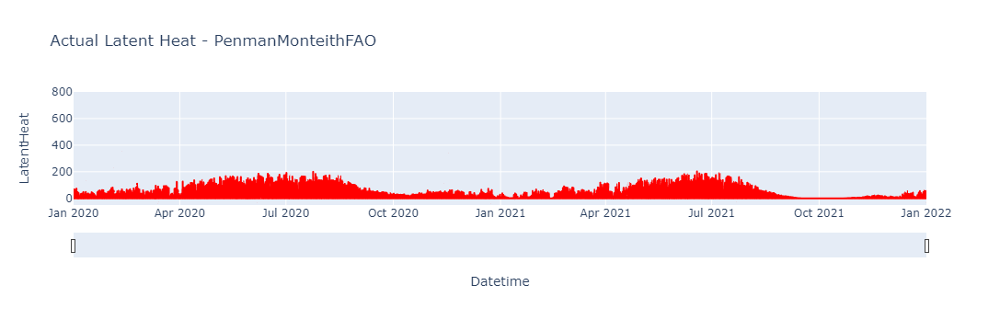

In [9]:
act_lh = pd.read_csv('ActualLatentHeat_PMFAO_2.csv',skiprows=6, sep=',', parse_dates=[0], na_values=-9999,usecols=[1,2])
act_lh.columns = ['Datetime','LatentHeat']
fig = px.line(act_lh, x='Datetime', y='LatentHeat', title='Actual Latent Heat - PenmanMonteithFAO')
fig.update_layout(yaxis_range=[-50, 800])
fig.update_traces(line_color='red')
fig.update_xaxes(rangeslider_visible=True)
fig.show()